## Summary of variables + features




In [65]:
#!pip install --upgrade scikit-learn

In [66]:
#Loading the data and np numpy and pd pandas
import pandas as pd
import numpy as np
pd.set_option('display.max_rows', 30)
print("Setup complete.")

Setup complete.


In [67]:
#designate the path of the health train data
health_data_path = "health_train.csv"

#Load the data using pandas read_csv function. 

health_data = pd.read_csv(health_data_path)

health_data.head()


,id,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,...,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,target
0,PA1001,1406,145.0,F,0.005,0.000,0.002,0.000,0.0,0.0,46.0,0.8,...,O+,67.0,104.0,171.0,4.0,0.0,155.0,153.0,154.0,4.0,1.0,Low risk
1,PA1002,258,127.0,M,0.012,0.000,0.008,0.004,0.0,0.0,13.0,3.8,...,A+,138.0,53.0,191.0,12.0,1.0,133.0,126.0,131.0,41.0,0.0,Low risk
2,PA1003,479,145.0,F,0.000,0.000,0.000,0.002,0.0,0.0,57.0,0.5,...,O+,46.0,111.0,157.0,1.0,1.0,150.0,146.0,149.0,6.0,1.0,Low risk
3,PA1004,906,146.0,F,0.004,0.000,0.005,0.003,0.0,0.0,29.0,1.2,...,O+,62.0,107.0,169.0,2.0,2.0,150.0,147.0,149.0,7.0,0.0,Low risk
4,PA1005,1921,140.0,F,0.002,0.003,0.006,0.006,0.0,0.0,62.0,1.6,...,B+,153.0,75.0,228.0,9.0,0.0,142.0,118.0,142.0,20.0,0.0,Low risk


Each record has various attributes related to patient status such as id, x1, x2, etc.

The overall aim is to classify the health status of a patient - the target column is labelled "target"

Note: because we are using health data, could it be more ethically correct to overclassify people as high risk than underclassify people as low risk - it would be bad if a high risk person was falsely labelled low risk and they were harmed due to lack of investigation. (find the official word for this)



In [68]:
#Get number of records and attributes
health_data.shape

(1584, 26)

There are 1584 records, and 26 fields (including the target field)

#### Get percentage of fields with missing values, and percentage of records with missing values:

In [69]:
#how many missing values per column?
missing_values_count = health_data.isnull().sum()
missing_values_count

id         0
x1         0
x2         0
x3         0
x4         0
x5        44
x6         0
x7         0
x8        17
x9         0
x10       27
x11        0
x12        0
x13        0
x14        0
x15        0
x16        0
x17        0
x18        0
x19        0
x20        0
x21        0
x22        0
x23        0
x24        0
target     0
dtype: int64

We can see above that rows x5, x8 and x10 have missing values.

In [70]:
#What percentage of these columns have misin values 

#number of columns with missing values:
num_cols_missing_vals = np.count_nonzero([missing_values_count])

#number of columns:
num_cols = health_data.shape[1]

print("Number of columns: ", num_cols)
print("Number of columns with missing values: ", num_cols_missing_vals)

# 26 columns, 3 with missing values. percentage of columns with missing labels is (3 / 26) * 100

print("Percentage of columns with missing values: ", (num_cols_missing_vals / num_cols) * 100)

Number of columns:  26
Number of columns with missing values:  3
Percentage of columns with missing values:  11.538461538461538


In [71]:
#what percentage of rows (records) have missing values?


num_rows_missing_vals = 0

# step through rows
for row in range(health_data.shape[0]):
    if ((np.count_nonzero(health_data.loc[row].isnull())) > 0):
        num_rows_missing_vals += 1

print("Number of rows: ", health_data.shape[0])
print("Number of rows missing values: ", num_rows_missing_vals)
print("Percentage of rows missing values: ", num_rows_missing_vals / health_data.shape[0] * 100)

Number of rows:  1584
Number of rows missing values:  86
Percentage of rows missing values:  5.42929292929293


In [72]:
#what is the total percentage of missing cells?
total_cells = np.product(health_data.shape)
total_missing = missing_values_count.sum()

# percent of data that is missing
percent_missing = (total_missing/total_cells) * 100
print("Percentage of cells with missing data: ", percent_missing)

Percentage of cells with missing data:  0.2136752136752137


It is useful to see whereabouts the dataset is missing data because if the dataset is missing a lot of data, it may be hard to use it to classify anything, and some classification algorithms may break if there is missing data. 

The overall percentage of cells with missing data is pretty low, with only about 1 in every 500 cells missing data. Although columns x5, x8 and x10 have more missing values than the rest of the columns, they should still hopefully be useful sources of data, with only 2.77%, 1.07% and 1.70% of their values missing respectively.

We can use various methods in the cleansing stage to fill in the blanks in the missing data.

#### Getting information about target variable
- get whether there is a target field, 
- get the labels of the target field,
- get distribution of target class labels

In [73]:
#get whether there is a target field
print("According to the brief, the target field is 'target'")

According to the brief, the target field is 'target'


In [74]:
#get the labels of the target field,
target_labels = health_data["target"].unique()
print("Target field labels: ", target_labels)

Target field labels:  ['Low risk' 'Moderate risk' 'High risk']


In [75]:
#get distribution of target class labels
target_field_value_counts = health_data["target"].value_counts()
target_field_value_percentages = target_field_value_counts / health_data.shape[0] * 100
print("Target class distribution percentages: \n")
#todo check id distribution should be percentage or fraction
print(target_field_value_percentages)

Target class distribution percentages: 

Low risk         77.967172
Moderate risk    13.825758
High risk         8.207071
Name: target, dtype: float64


It is useful to see if the distribution of the target class is even or not. If the class distribution is very uneven, then the class with the smallest distributution may never be predicted. In this case, the moderate and high risk records take up 14% and 8% of the records respectively. Although OK, it may be a good idea to use balancing algorithms in the cleansing stage to make the proportions more even.

#### Get integration required to form db from multiple sources
no integration is required, all the data is from one source (but data cleaning may be required, this has not been investigated yet, see the next part of this project)
#### Get speed with which the data can be accessed
As this is digital data rather than paper, it can be accessed almost instantly.

It's useful to know this information if the dataset was split accross multiple files and was not digital, as it's neccessary to understand if any problems will arise when trying to make a full dataset, and if this may slow down the data mining process a lot. Luckily,, in our case, the dataset is made from one digital file, so everythig should be quick and easy to do, as long as we do the appropriate familiarisation and pre-processing steps.

### Database Familiarisation

In [76]:
#Which columns are numerical and which are categorical?
all_col_labels = health_data.columns
numeric_col_labels = list(health_data._get_numeric_data().columns)
categorical_col_labels = list(set(all_col_labels) - set(numeric_col_labels))

print("Numeric: ", numeric_col_labels)
print("Categorical: ", categorical_col_labels)

Numeric:  ['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21', 'x22', 'x23', 'x24']
Categorical:  ['x3', 'x14', 'target', 'id']


Its useful to see which columns are discrete and which are categorical because we can then determine which data processing techniques can be used on which columns. For example, CHAID cannot be used on numerical attributes, so if we wanted to use CHAID we would have to ignore all the numerical attributes for it to work. Or because there are a high number of numerical attributes, we could decide not to use CHAID altogether - we might want to use CART - or maybe ID3 to cover categorical and numerical attributes.

In [77]:
#describe whether the numeric columns are discrete or continuous (e.g. discrete-  number of children, continuous - temperature)
health_data_numeric = health_data[numeric_col_labels]
'''
With no column labels to infer what things are, this might be tricky. the best we can do is see which columns only 
contain whole numbers (integers, or floats ending with .0) and which dont. however, as we don't know much about 
the data, we cant know if any of these have been pre processed, and are in fact continuous attributes which have 
been rounded to the nearest whole number.
'''
#to check which columns contain only integer, we will apply 'mod 1' to all the values. if the number is whole, 
#then an answer of 0 will be given. Then, we sum all the cell values for each column, and any columns with values above 
#0 contain decimals.

#apply modulus 1 to all cells
health_data_numeric_modulus = health_data_numeric.applymap(lambda x: x%1)
#sum the total of each columns 
modulus_vals_count = health_data_numeric_modulus.sum()

num_continuous_columns = 0
print("COLUMNS WHICH ARE CONTINUOUS:")
for index, value in modulus_vals_count.items():
    if (value > 0):
        print(f"Column name : {index}, Value : {value}")
        num_continuous_columns = num_continuous_columns + 1
print(f"Number of continous columns: {num_continuous_columns}")

print("\nCOLUMNS WHICH ARE DISCRETE:")
for index, value in modulus_vals_count.items():
    if (value == 0):
        print(f"Column name : {index}, Value : {value}")
        num_continuous_columns = num_continuous_columns + 1
print(f"Number of discrete columns: {num_continuous_columns}")

COLUMNS WHICH ARE CONTINUOUS:
Column name : x4, Value : 5.0200000000000005
Column name : x5, Value : 15.256
Column name : x6, Value : 6.886000000000001
Column name : x7, Value : 2.936
Column name : x8, Value : 0.004
Column name : x9, Value : 0.249
Column name : x11, Value : 738.1
Column name : x13, Value : 682.3
Number of continous columns: 8

COLUMNS WHICH ARE DISCRETE:
Column name : x1, Value : 0.0
Column name : x2, Value : 0.0
Column name : x10, Value : 0.0
Column name : x12, Value : 0.0
Column name : x15, Value : 0.0
Column name : x16, Value : 0.0
Column name : x17, Value : 0.0
Column name : x18, Value : 0.0
Column name : x19, Value : 0.0
Column name : x20, Value : 0.0
Column name : x21, Value : 0.0
Column name : x22, Value : 0.0
Column name : x23, Value : 0.0
Column name : x24, Value : 0.0
Number of discrete columns: 22


In [78]:
numeric_continuous_columns = ['x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x11', 'x13']
numeric_discrete_columns = ['x1', 'x2', 'x10', 'x12', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21', 'x22', 'x23', 'x24']

We can see from this output that the continuous columns are x4, x5, x6, x7, x8, x9, x11 and x13.
The discrete columns are x1, x2, x10, x12, x15, x16, x17, x18, x19, x20, x21, x22, x23 and x24.

Reliability info:

However, because of the feature names being removed, we cannot tell from context if this is definitly true. If the data had been preprocessed prior to anonymisation, for example if columns were rounded to the nearest whole number, then they may have been continous originally. There is no way of telling now whether this is true.

Knowing whether features are continuous or discrete can be useful, as it tells us which tools we can use to analyse wich parts of the data. If we are using a decision tree algorithm which finds every possible binary split of continuous attributes, we may want to note that there are a fair few continuous columns in our dataset, and the tree must be pruned after its creation to avoid overfitting with all the continuous attributes.

In [79]:
#define whether categorical columns have an implied ordering (e.g. small medium or large) 
#or no implied ordering (e.g. male or female)
categorical_labels = ['target', 'x14', 'id', 'x3']

print("First five patient ids:")
print(health_data['id'].head())
print("the patient ID labels are unique, and because they are IDs they have no implied ordering.")

print("\nUnique labels for column x3:")
x3_labels = health_data["x3"].unique()
print(x3_labels)
print("We can infer from the unique values of x3 that this column is the patients gender, and thus has no implied ordering.")

print("\nUnique labels for column x14:")
x14_labels = health_data["x14"].unique()
print(x14_labels)
print("We can infer from the unique values of x3 that this column is the patients blood type, and thus has no implied ordering.")

print("\nUnique labels for the target column:")
print(target_labels)
print(f"The labels {target_labels} have an implied order, of low, then medium, then high.")

First five patient ids:
0    PA1001
1    PA1002
2    PA1003
3    PA1004
4    PA1005
Name: id, dtype: object
the patient ID labels are unique, and because they are IDs they have no implied ordering.

Unique labels for column x3:
['F' 'M']
We can infer from the unique values of x3 that this column is the patients gender, and thus has no implied ordering.

Unique labels for column x14:
['O+' 'A+' 'B+' 'O-' 'A-' 'B-' 'AB-' 'AB+']
We can infer from the unique values of x3 that this column is the patients blood type, and thus has no implied ordering.

Unique labels for the target column:
['Low risk' 'Moderate risk' 'High risk']
The labels ['Low risk' 'Moderate risk' 'High risk'] have an implied order, of low, then medium, then high.


Its useful to know whether categorical columns have an implied ordering. It is possible to find correlations with ordinal data because it has an implied order if clusters of risk level vs an attribute had a rough positive correlation, then it may be possible to assume that people with risk levels bordering low and medium, or medium and high, would have attribute values between the averages of low and high. This could be useful if the ordinal scale of risk were to be adjusted.

In [80]:
#describe the numeric columns
pd.set_option('display.max_rows', 8)
pd.set_option('display.max_columns', 25)
health_data[numeric_col_labels].describe()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
count,1584.000000,1584.000000,1584.000000,1540.000000,1584.000000,1584.000000,1567.000000,1584.000000,1557.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000,1584.000000
mean,1053.188131,133.297980,0.003169,0.009906,0.004347,0.001854,0.000003,0.000157,47.094412,1.337816,10.008838,8.255240,70.409091,93.496843,163.905934,4.063763,0.324495,137.333965,134.542929,137.935606,18.448232,0.309343
std,615.996716,10.002632,0.003821,0.048627,0.002948,0.002940,0.000050,0.000593,17.269621,0.899092,18.520206,5.784579,38.993892,29.593370,17.908749,2.950268,0.718499,16.461643,15.729735,14.622680,28.375002,0.615868
min,0.000000,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.000000,0.200000,0.000000,0.000000,3.000000,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000
25%,523.750000,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.600000,36.000000,67.000000,152.000000,2.000000,0.000000,128.000000,125.000000,128.000000,2.000000,0.000000
50%,1049.500000,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.400000,68.000000,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000
75%,1583.250000,141.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.000000,10.700000,100.000000,120.000000,174.000000,6.000000,0.000000,148.000000,145.250000,148.000000,23.000000,1.000000
max,2125.000000,160.000000,0.019000,0.477000,0.014000,0.015000,0.001000,0.005000,86.000000,7.000000,91.000000,50.700000,176.000000,158.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000


In [81]:
#number of missing values in numeric columns:
pd.set_option('display.max_rows', 30)
health_data[numeric_col_labels].isnull().sum()

x1      0
x2      0
x4      0
x5     44
x6      0
x7      0
x8     17
x9      0
x10    27
x11     0
x12     0
x13     0
x15     0
x16     0
x17     0
x18     0
x19     0
x20     0
x21     0
x22     0
x23     0
x24     0
dtype: int64

In [82]:
#describe the categorical health data
health_data[categorical_col_labels].describe()

,x3,x14,target,id
count,1584,1584,1584,1584
unique,2,8,3,1584
top,M,O+,Low risk,PA1001
freq,842,410,1235,1


In [83]:
#number of missing values in categorical columns:
health_data[categorical_col_labels].isnull().sum()

x3        0
x14       0
target    0
id        0
dtype: int64

#### Grouping by the target class, and then getting the statistics

``` DONE UP TO HERE IN EXCEL ```

In [84]:

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(health_data.groupby('target').agg([len,min,max,np.mean,np.std]))


                 x1                                       x2                \
                len min   max         mean         std   len    min    max   
target                                                                       
High risk       130   6  2048  1183.876923  727.193405   130  110.0  152.0   
Low risk       1235   1  2125  1117.708502  593.583206  1235  106.0  160.0   
Moderate risk   219   0  2124   611.762557  467.435035   219  120.0  159.0   

                                       x4                                  \
                     mean       std   len  min    max      mean       std   
target                                                                      
High risk      131.700000  9.430817   130  0.0  0.004  0.000392  0.000960   
Low risk       132.012146  9.653260  1235  0.0  0.019  0.003975  0.003947   
Moderate risk  141.497717  8.245307   219  0.0  0.005  0.000274  0.000765   

                 x5                                    x6           

Some notes: X1, oddly, has a lower mean for moderate risk as opposed to high and low risk. Low risk records have a fairly large max x4 and mean x4 value compared to moderate and high risk records. X23 has a higher mean for high risk records.

I made these observations, and then realised that if there were any outliers in the dataset, they could be havily skewing the values for each attribute. This stage will be repeated again after outlier identification and removal to get more of an idea of the true observations that can be made.

### Outlier Detction
- Should make box plots of the different attributes. Though its worth looking up how the outliers for the box plots are clalculated? This could be a good way of working out which attributes have obvious outliers though.

- DBSCAN is not the best with higher dimensionality data (the higher the dimensions, the lower the accuracy), so probably not a good idea to use this on everything. Could try using it on the categorical data though?

- According to [this article](https://towardsdatascience.com/5-ways-to-detect-outliers-that-every-data-scientist-should-know-python-code-70a54335a623), isolation forest is a good way of detecting outliers for high dimensionality datasets.


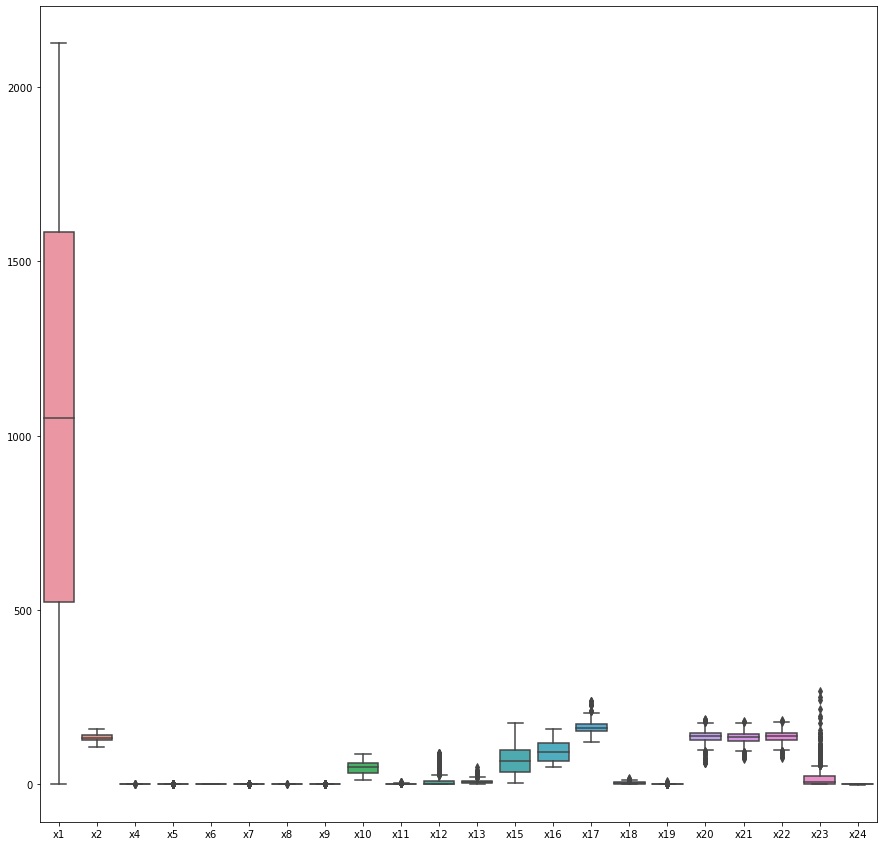

In [85]:
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#making box plots of attributes
plt.figure(figsize=(15,15))
sns.boxplot(data=health_data)
plt.show()

The data has not been standardised - this means the ranges on the box plots are all quite different. However, some interesting stuff can be gathered from this:
- After seeing the even spread for x1, I am more interested in seeing what it is. is it discrete, continuous? what are the unique values. It seems very evenly spread across its range from 0 to 2125.
- What are all the outliers in x23? There are lots above the box plot's maximum - could these have any link to our target class? e.g. are all the outliers for one class?
- Also, how are seaborn box plot outliers calculated? This would give interesting insight into all this.
    - Apparently, according to [this website](https://towardsdatascience.com/creating-boxplots-with-the-seaborn-python-library-f0c20f09bd57#:~:text=The%20minimum%20and%20maximum%20values,are%20referred%20to%20as%20outliers.), "The minimum and maximum values are defined as Q1–1.5 * IQR and Q3 + 1.5 * IQR respectively. Any points that fall outside of these limits are referred to as outliers"

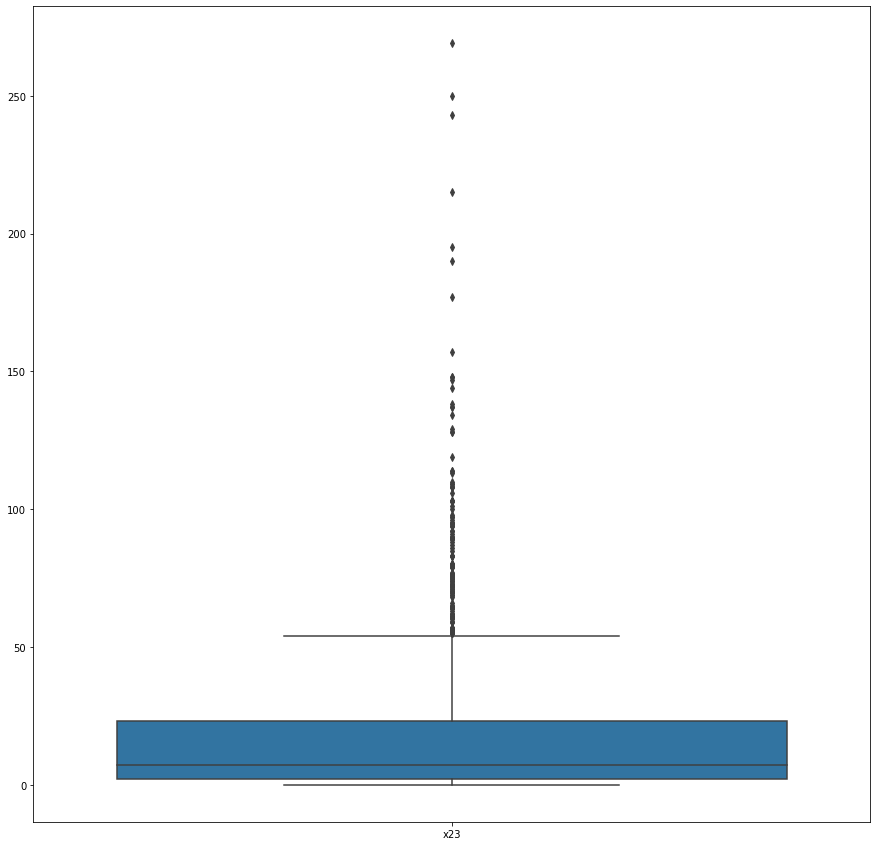

In [86]:
#making box plots of x23
plt.figure(figsize=(15,15))
sns.boxplot(data=health_data[["x23"]])
plt.show()

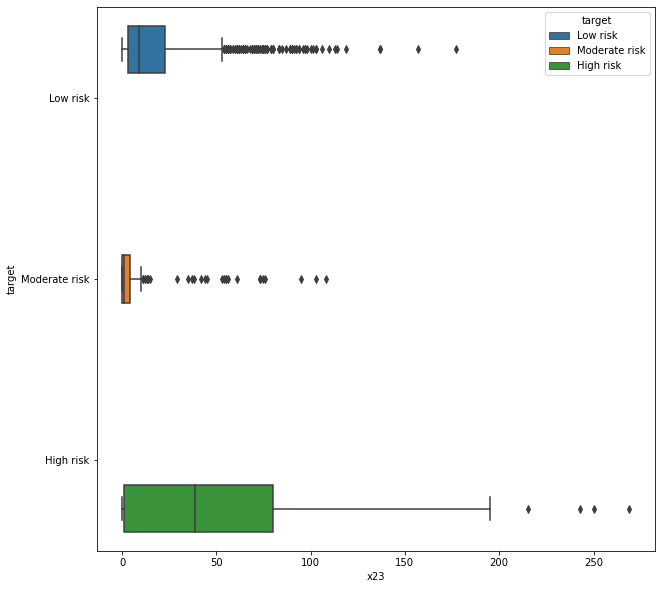

In [88]:
#making box plots of x23
plt.figure(figsize=(10,10))
sns.boxplot(data=health_data, x="x23", y="target", hue = "target")
plt.show()

Lots of outliers above the upper maximum For all classes. lets try to see if the target class has any noticble outliers

<AxesSubplot:xlabel='target', ylabel='x23'>

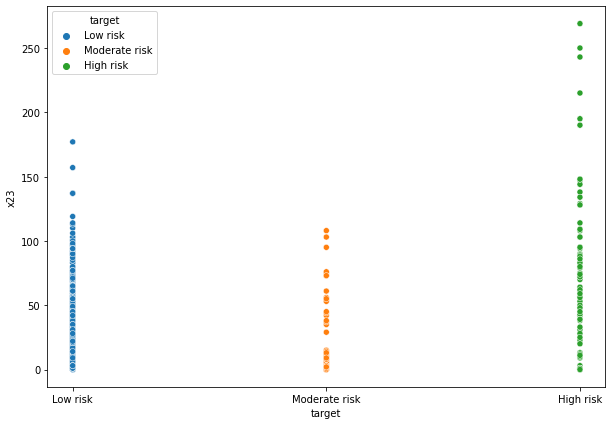

In [89]:
# Set the width and height of the figure
plt.figure(figsize=(10,7))
sns.scatterplot(x=health_data['target'], y=health_data['x23'],hue=health_data['target'])

We cant gather too much from these, buit it is interesting to note that the interquartile range and boxplot maximum and minimum span much larger x23 values for high risk than low and moderate risk. x23 is a discrete column, it will be interesting to see how strong its link with the target class is.

Now lets have another look at x1. First lets display the values according to the patiend ID to se eif theres any link there.

<AxesSubplot:ylabel='x1'>

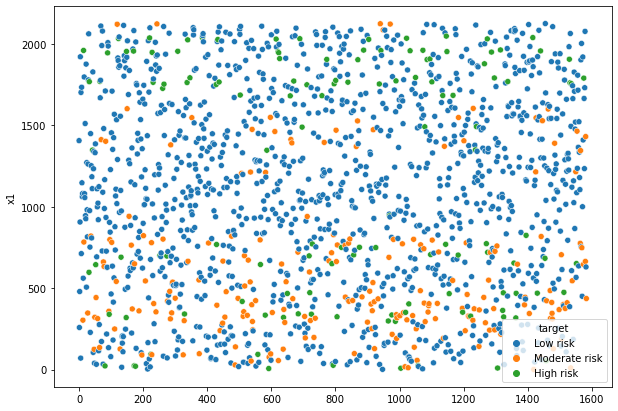

In [90]:
plt.figure(figsize=(10,7))
sns.scatterplot(x=health_data.index, y=health_data['x1'],hue=health_data['target'])

Seems completely unrelated to the patient ID. Lets check the distribution

<Figure size 720x504 with 0 Axes>

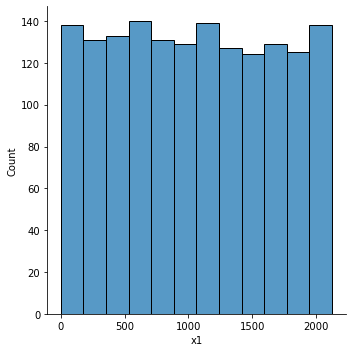

In [91]:
plt.figure(figsize=(10,7))
sns.displot(health_data["x1"])

Distribution seems very even. lets quickly check the individual box plots, split by the target class to see if there could be any relation. IF not we can probably remove this, if it is seemingly random and evenly distrbuted.

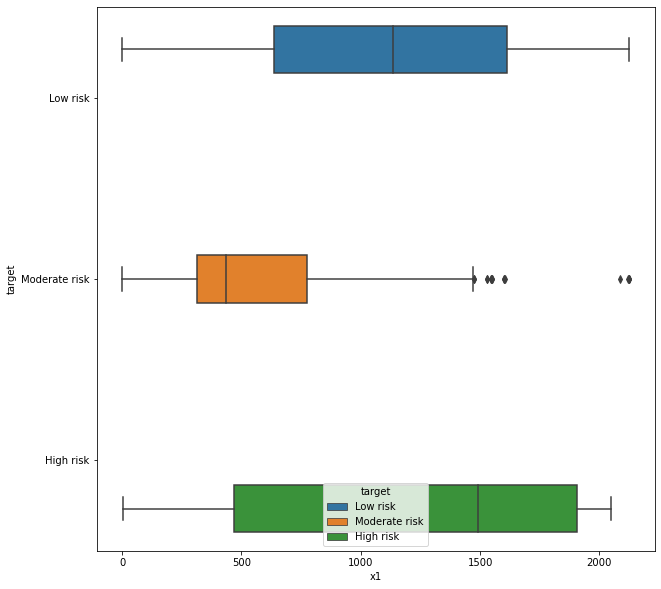

In [92]:
#making box plots of x1
plt.figure(figsize=(10,10))
sns.boxplot(data=health_data, x="x1", y="target", hue = "target")
plt.show()

The low and high risk IQRs are pretty similar, but the moderate risk is lower. this is interesting. Will be interesting to see if this correlates with anything else.

Because of the varying ranges, lets create individual box plots for each attribute and see how they all look.

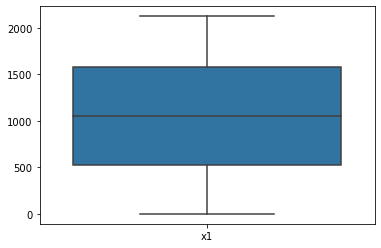

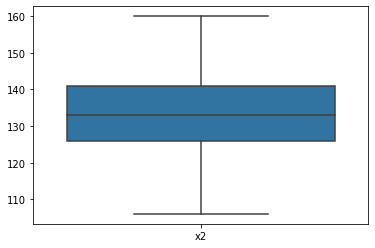

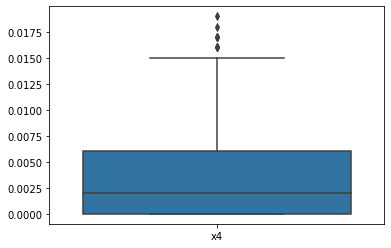

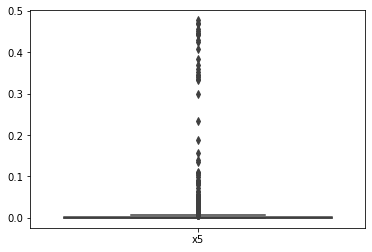

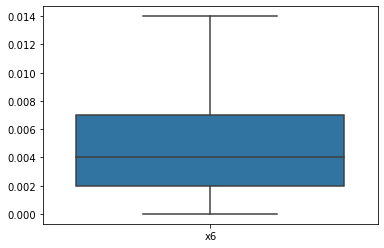

...

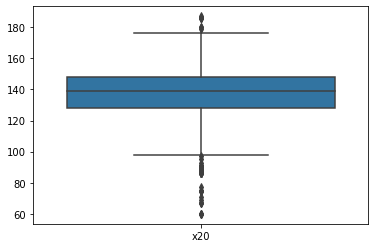

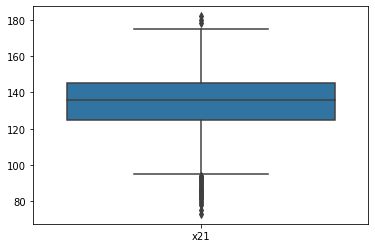

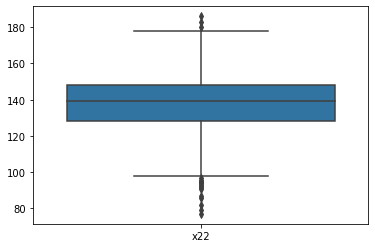

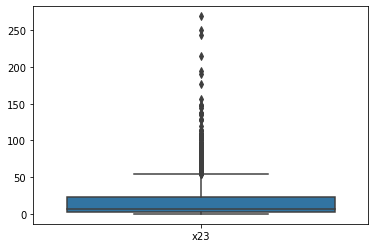

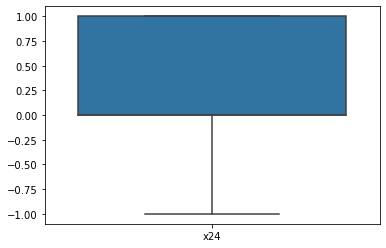

In [94]:
#lets look at numeric boxplots first

for column in numeric_col_labels:
    plt.figure(column)
    sns.boxplot(data=health_data[[column]])
    plt.show()
    

Notes:
- x9 seems to be only zero apart from 4 outliers
- x8 seems to be mainly zero apart from 1 outlier
- x5, x7, x11, x12, x13, x23 seem to have their outliers as a psoitive tail - they could be rare cases rather than outliers.

Its difficult to tell what are outliers and what are not without feature names. I don't want to accidentally remove "outliers" which are actually signifiers of the "high risk" target class, which has a smaller distribution than the others.

To solve this, I will create a train test split in the test data later, and see how my models wich I will use down the line change with varying types of outlier removal. I could put the outlier removal varitations in a paremeter grid with cross validation, to see if one type performs better than the others. It's very hard to see the relationships with the human eye, especially without feature names, but hopefully the results of cross validating the options will give a clearer picture.

now lets do a pair grid of numeric variables and see if anything iteresting appears.
- maybe we need to standardise rthe data before doing this?

C:\Users\Will\anaconda3\lib\site-packages\seaborn\distributions.py:1106: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\Will\anaconda3\lib\site-packages\seaborn\distributions.py:1106: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\Will\anaconda3\lib\site-packages\seaborn\distributions.py:1106: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\Will\anaconda3\lib\site-packages\seaborn\distributions.py:1106: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\Will\anaconda3\lib\site-packages\seaborn\distributions.py:1106: UserWarning: Dataset has 0 variance

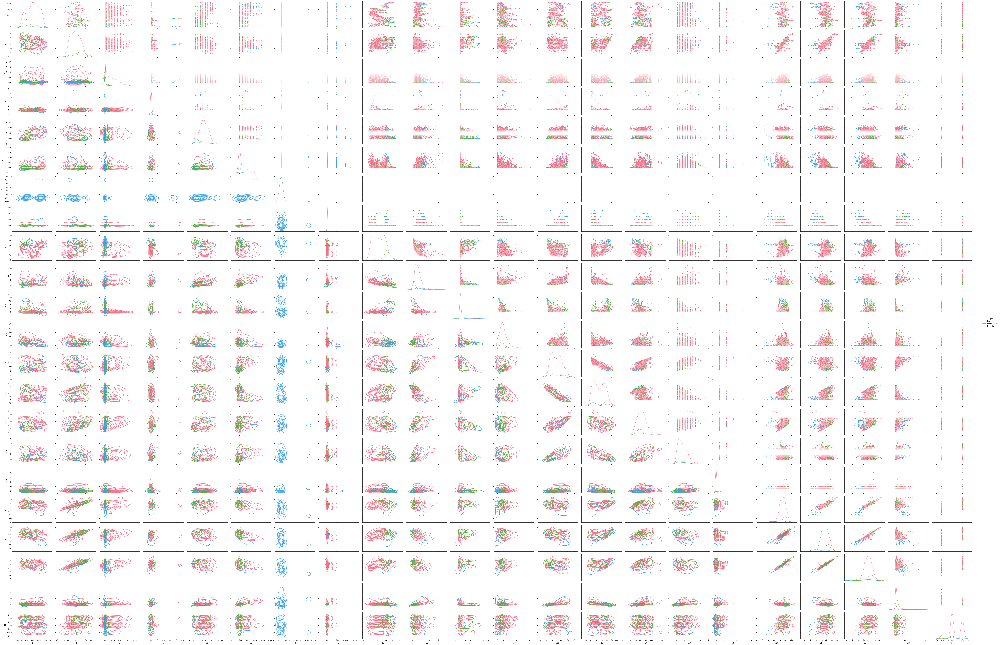

In [96]:
#UNCOMMENT THIS IN FINAL THING - commented because it takes ages

#diagnistic gragh to analysis any patern based on target value
grid = sns.PairGrid(health_data, hue='target', diag_sharey=False, palette="husl",aspect=1.5)

grid.map_upper(sns.scatterplot, s=15)
grid.map_lower(sns.kdeplot)
grid.map_diag(sns.kdeplot, lw=1)
grid.add_legend()

Although massive, this pairgrid is useful (its easier to see the values if you download the image and zoom in)

It seems like x8 only has values for high risk individuals - lets investigate this.

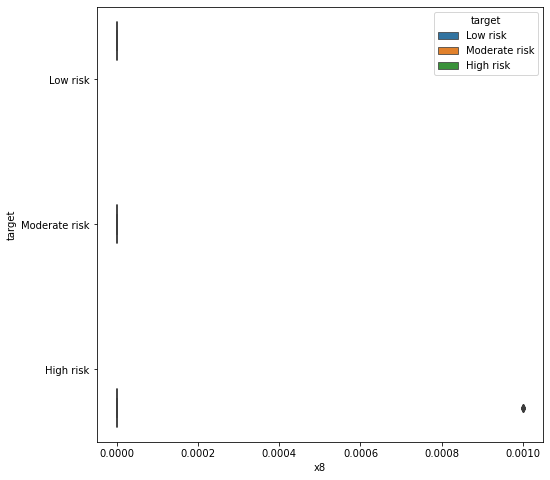

In [97]:
#making box plots of x8
plt.figure(figsize=(8,8))
sns.boxplot(data=health_data, x="x8", y="target", hue = "target")
plt.show()

<Figure size 1008x504 with 0 Axes>

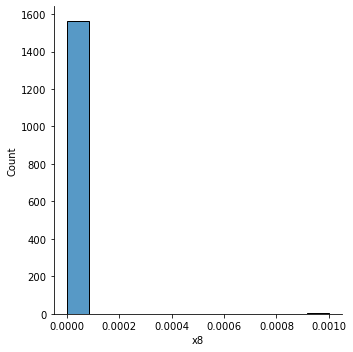

In [98]:
plt.figure(figsize=(14,7))
sns.displot(health_data["x8"])

In [99]:
s = health_data["x8"]
s.to_numpy().nonzero() 

(array([  21,  123,  265,  330,  346,  495,  496,  618,  683,  696,  788,
         954, 1050, 1066, 1081, 1282, 1296, 1326, 1340, 1437, 1528],
       dtype=int64),)

Very few records have non zero values. But, all these records are for high risk patients. This should be noted.

## Note about reliability
With our categorical variables, we can infer some reliability. We can assume x14 (which appears to be blood type) to be reliable, as there is no reasons to lie about blood type (unless someone entering the blood type into the DB has made a mistake). x3 (which appears to be gender), we can assume is mostly reliable - the distrbution between M and F is roughly even, and the number of records should hopefully mean any people who may have put a different gender (maybe because they do not want to be discriminated against?) will be lost in the noise. (A distribution of the "m" and "f" records can be seen below)

However, we cannot judge the reliability of other records. This could be an issue - people may give false information about sensitive data if they think they may be discriminated against. However, as we do not know how data was gathered or what the attributes mean, it is difficult to determine if any attributes could be unreliable.

Write about continuous vs discrete reliability too

<Figure size 1008x504 with 0 Axes>

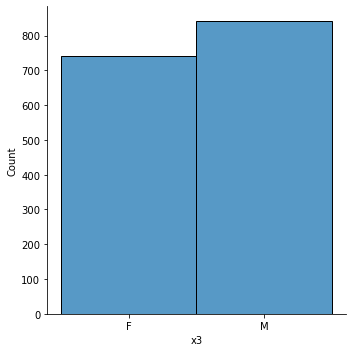

In [100]:
plt.figure(figsize=(14,7))
sns.displot(health_data["x3"])

Next up: preprocessing. Outlier removal and standardization will have to be a part of the pre processing section. I need to check multiple combinations of outler removal techniques and imputation techniques to find which is the best one.